# Introduction

https://docs.python.org/3/tutorial/index.html

HII regions are an important subject of study for characterizing a galaxy. These are nebulae produced by the ionization of neutral gas due to the radiation from hot stars. Therefore, they are good tracers of star formation and, through their spectrum, allow us to obtain information about the regions themselves and the interstellar medium.

In this work, we will locate the HII regions from an uncorrected image of a galaxy, using a broad R band and a narrow H$\alpha$ band, each containing four fits images. Through this program written in python, we will create lists of all the elements used for the observation (bias, flats, and the galaxy's original image) along with their corresponding statistical data. Next, we will clean the original image of cosmic rays detected by the CCD and remove the noise produced by the detector itself (bias). We will also take into account the pixel sensitivity using the flats, the sky light that hinders the observation of the galaxy, as well as the exposure time for each band. Finally, we will remove the continuum from the H$\alpha$ band to obtain only the H$\alpha$ line and plot the obtained HII regions in both two and three dimensions.

# Libraries

We import all the libraries that we will use throughout the program.

In [4]:
import glob
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import lacosmic
from astropy.stats import sigma_clipped_stats, SigmaClip
from photutils.segmentation import detect_threshold, detect_sources
from photutils.utils import circular_footprint
from photutils.detection import DAOStarFinder
from photutils.aperture import CircularAperture, aperture_photometry
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
import scipy.ndimage as ndimage
from mpl_toolkits.mplot3d import axes3d

# Lists

https://docs.astropy.org/en/stable/io/fits/index.html

We store all the FITS images in fileList.

In [7]:
fileList = sorted(glob.glob('*fits'))
fileList

['r326214.fits',
 'r326215.fits',
 'r326216.fits',
 'r326217.fits',
 'r326218.fits',
 'r326219.fits',
 'r326220.fits',
 'r326221.fits',
 'r326222.fits',
 'r326223.fits',
 'r326229.fits',
 'r326230.fits',
 'r326231.fits',
 'r326232.fits',
 'r326233.fits',
 'r326234.fits',
 'r326245.fits',
 'r326246.fits',
 'r326247.fits',
 'r326248.fits',
 'r326249.fits',
 'r326250.fits',
 'r326251.fits',
 'r326252.fits',
 'r326285.fits',
 'r326286.fits',
 'r326287.fits',
 'r326288.fits',
 'r326289.fits',
 'r326290.fits',
 'r326291.fits',
 'r326292.fits',
 'r326293.fits',
 'r326294.fits',
 'r326295.fits',
 'r326296.fits',
 'r326297.fits',
 'r326298.fits',
 'r326299.fits',
 'r326300.fits',
 'r326301.fits',
 'r326310.fits',
 'r326311.fits',
 'r326312.fits',
 'r326313.fits']

We examine the header of the previous fits file list to determine whether the image is a bias, flats, or galaxy, as well as observation data such as the exposure time through the header. Using fits.open(), we can open a fits file, and with .info, we can view the Header Data Units that will contain all the information.

In [8]:
hdul = fits.open(fileList[1])
hdul.info()

Filename: r326215.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     143   (2088, 2120)   int16 (rescales to uint16)   


In the Primary HDU (hdul[0]), we can view the header with .header and the pixel data with .data. The header contains multiple pieces of information, but we are specifically interested in two: OBJECT and EXPTIME, which correspond to the name and the exposure time, respectively.

In [9]:
for file in fileList:
   hdul = fits.open(file)
   print(file, hdul[0].header['OBJECT'], hdul[0].header['EXPTIME'])

r326214.fits Bias 0.0
r326215.fits Bias 0.0
r326216.fits Bias 0.0
r326217.fits Bias 0.0
r326218.fits Bias 0.0
r326219.fits FlatHa6607 3.01
r326220.fits FlatHa6607 3.01
r326221.fits FlatHa6607 3.01
r326222.fits FlatHa6607 6.01
r326223.fits FlatHa6607 10.01
r326229.fits FlatrS 5.01
r326230.fits FlatrS 10.01
r326231.fits FlatrS 25.01
r326232.fits FlatrS 60.01
r326233.fits FlatrS 90.01
r326234.fits FlatrS 120.01
r326245.fits cig0736r 300.01
r326246.fits cig0736r 300.01
r326247.fits cig0736r 300.01
r326248.fits cig0736r 300.01
r326249.fits cig0736Ha6607 1200.01
r326250.fits cig0736Ha6607 1200.01
r326251.fits cig0736Ha6607 1200.01
r326252.fits cig0736Ha6607 1200.01
r326285.fits Bias 0.0
r326286.fits Bias 0.0
r326287.fits Bias 0.0
r326288.fits Bias 0.0
r326289.fits Bias 0.0
r326290.fits Bias 0.0
r326291.fits Bias 0.0
r326292.fits Bias 0.0
r326293.fits Bias 0.0
r326294.fits Bias 0.0
r326295.fits FlatAmarS 120.01
r326296.fits FlatAmarS 120.01
r326297.fits FlatAmarS 120.01
r326298.fits FlatAmarS

We define a function to obtain the statistics for the bias, flats, and galaxy images. In this function, we will calculate the total number of pixels in the fits image, the minimum and maximum values of all the pixels, the mean, the median, and the standard deviation.

In [10]:
def imstats(data):
    """
    Calculates statistical parameters such as total, maximum, minimum, mean, median, and standard deviation of a dataset while ignoring NaN values.

    Parameters
    ----------
    data : numpy.ndarray
        Array of a dataset.

    Returns
    -------
    dict
        A dictionary with the following statistics:
        - 'total': total number of elements in the data array.
        - 'minimum': minimum value, ignoring NaN values.
        - 'maximum': maximum value, ignoring NaN values.
        - 'average': mean, ignoring NaN values.
        - 'median': median, ignoring NaN values.
        - 'desviation': standard deviation, ignoring NaN values.
    """

    x, y = np.shape(data)[0], np.shape(data)[1]
    stad = x * y, float(np.nanmin(data)), float(np.nanmax(data)), float(np.nanmean(data)), float(np.nanmedian(data)), float(np.nanstd(data))
    dicti = {'total':stad[0], 'minimum':stad[1], 'maximum':stad[2], 
             'average':stad[3], 'median':stad[4], 'desviation':stad[5]}
    return dicti

## Bias List

When we make an observation, we not only detect the signal coming from the area of the sky but also the corresponding noise emitted by the instrumentation itself. To detect this noise, we will measure with the CCD camera and the shutter closed, with an exposure time set to zero. By taking several measurements this way, we will obtain the **bias**. In biasNames, we will store the names of the bias files, and in bias, in addition to the names, we will store the statistical data as a dictionary.

In [11]:
biasNames = [
    file_bias for file_bias in fileList 
    if 'Bias' in fits.open(file_bias)[0].header['OBJECT']
]
bias = [
    [
        file_biasNames, fits.open(file_biasNames)[0].header['OBJECT'], 
        imstats(fits.open(file_biasNames)[0].data)
    ] 
    for file_biasNames in biasNames
]

We visualize the list.

In [12]:
print('Lista de Bias:')
for item_bias in bias:
    print(item_bias)

Lista de Bias:
['r326214.fits', 'Bias', {'total': 4426560, 'minimum': 514.0, 'maximum': 3862.0, 'average': 541.0289572489698, 'median': 541.0, 'desviation': 5.29484102604657}]
['r326215.fits', 'Bias', {'total': 4426560, 'minimum': 514.0, 'maximum': 65535.0, 'average': 541.2434147509579, 'median': 541.0, 'desviation': 31.207988159418907}]
['r326216.fits', 'Bias', {'total': 4426560, 'minimum': 508.0, 'maximum': 65535.0, 'average': 541.2656701818116, 'median': 541.0, 'desviation': 31.36689770933954}]
['r326217.fits', 'Bias', {'total': 4426560, 'minimum': 509.0, 'maximum': 65535.0, 'average': 541.2682606809802, 'median': 541.0, 'desviation': 31.14453058554209}]
['r326218.fits', 'Bias', {'total': 4426560, 'minimum': 514.0, 'maximum': 65535.0, 'average': 542.2854098893949, 'median': 542.0, 'desviation': 31.14583383548535}]
['r326285.fits', 'Bias', {'total': 4426560, 'minimum': 508.0, 'maximum': 2414.0, 'average': 538.2795091447987, 'median': 538.0, 'desviation': 3.837124591351188}]
['r326286

## Flats List

he detector does not respond uniformly across all its areas. Some pixels are more sensitive than others, some reach their saturation point due to bright objects, and there can also be variation in luminosity due to the atmosphere. All of this contributes to a constant alteration in the observation, which can be corrected by the **flats**. To calibrate the detector, an observation is made with homogeneous illumination, thus obtaining the flats.

In [13]:
flatsNames = [
    file_flat for file_flat in fileList 
    if 'Bias' not in fits.open(file_flat)[0].header['OBJECT'] 
    and 'cig' not in fits.open(file_flat)[0].header['OBJECT']
]
flats = [
    [
        file_flatname, fits.open(file_flatname)[0].header['OBJECT'], 
        imstats(fits.open(file_flatname)[0].data)
    ] 
          for file_flatname in flatsNames
]

In [14]:
print('Lista de Flats:')
for item_flats in flats:
    print(item_flats)

Lista de Flats:
['r326219.fits', 'FlatHa6607', {'total': 4426560, 'minimum': 518.0, 'maximum': 23075.0, 'average': 9749.932615620255, 'median': 11377.0, 'desviation': 3928.619199883995}]
['r326220.fits', 'FlatHa6607', {'total': 4426560, 'minimum': 519.0, 'maximum': 18443.0, 'average': 7858.465789913613, 'median': 9153.0, 'desviation': 3122.0328752685396}]
['r326221.fits', 'FlatHa6607', {'total': 4426560, 'minimum': 517.0, 'maximum': 14660.0, 'average': 6388.975139611798, 'median': 7424.0, 'desviation': 2496.104595164152}]
['r326222.fits', 'FlatHa6607', {'total': 4426560, 'minimum': 516.0, 'maximum': 19833.0, 'average': 8448.815028374178, 'median': 9849.0, 'desviation': 3372.4260919515377}]
['r326223.fits', 'FlatHa6607', {'total': 4426560, 'minimum': 513.0, 'maximum': 24679.0, 'average': 10811.759617626329, 'median': 12629.0, 'desviation': 4378.8476055166175}]
['r326229.fits', 'FlatrS', {'total': 4426560, 'minimum': 514.0, 'maximum': 23854.0, 'average': 8483.502670696884, 'median': 1131

## Galaxies List

In the list, we find galaxies whose names begin with *cig*, and contain an *r* or *Ha*. This is how galaxies observed through an R filter and an H$\alpha$ filter are identified. Since our goal is to identify the H II regions, we will need these two filters. The H II regions are the result of UV radiation from young stars that dissociate hydrogen molecules and then photoionize the gas. Therefore, they are especially bright in the H$\alpha$ line. However, this line is located in the red part of the visible spectrum, and as a result, stars whose spectrum is similar to that of a black body also contribute to it. Thus, the function of the r filter is to eliminate the contribution of the stellar continuum in the H$\alpha$ line in order to locate the H II regions.

In [15]:
cigNames = [
    file_cig for file_cig in fileList 
    if 'cig' in fits.open(file_cig)[0].header['OBJECT']
]
cig = [
    [
        file_cigname, fits.open(file_cigname)[0].header['OBJECT'], 
        imstats(fits.open(file_cigname)[0].data)
    ] 
    for file_cigname in cigNames
]

In [16]:
print('Lista de galaxias:')
for item_cig in cig:
    print(item_cig)

Lista de galaxias:
['r326245.fits', 'cig0736r', {'total': 4426560, 'minimum': 510.0, 'maximum': 65535.0, 'average': 689.7721955649533, 'median': 736.0, 'desviation': 264.29649531778097}]
['r326246.fits', 'cig0736r', {'total': 4426560, 'minimum': 511.0, 'maximum': 65535.0, 'average': 690.0315195095062, 'median': 736.0, 'desviation': 260.1432865916156}]
['r326247.fits', 'cig0736r', {'total': 4426560, 'minimum': 510.0, 'maximum': 65535.0, 'average': 683.5091691968481, 'median': 728.0, 'desviation': 257.55819054077665}]
['r326248.fits', 'cig0736r', {'total': 4426560, 'minimum': 512.0, 'maximum': 65535.0, 'average': 680.4435134732162, 'median': 723.0, 'desviation': 246.99515008827655}]
['r326249.fits', 'cig0736Ha6607', {'total': 4426560, 'minimum': 509.0, 'maximum': 65535.0, 'average': 553.2171519193233, 'median': 553.0, 'desviation': 87.19728709747316}]
['r326250.fits', 'cig0736Ha6607', {'total': 4426560, 'minimum': 515.0, 'maximum': 63558.0, 'average': 553.7231107225475, 'median': 554.0, 

# SuperBias

Once the bias files are identified, we will remove those whose standard deviation deviates significantly from the others and obtain the median of all the bias files, which we will call the **superbias**.

In [17]:
for badBias in ['r326214.fits', 'r326285.fits']:
    biasNames.remove(badBias)

In [18]:
bias_concat = [
    fits.open(bias_item)[0].data for bias_item in biasNames
]

In [19]:
superBias = np.nanmedian(bias_concat, axis=0)

We save the superbias.

In [20]:
hdu_superBias = fits.PrimaryHDU(superBias.astype(np.float32))
hdu_superBias.writeto('superBias.fits', overwrite=True)

We plot the superbias, adjusting the maximum and minimum values with the standard deviation defined by the *imstats* function to avoid saturation.

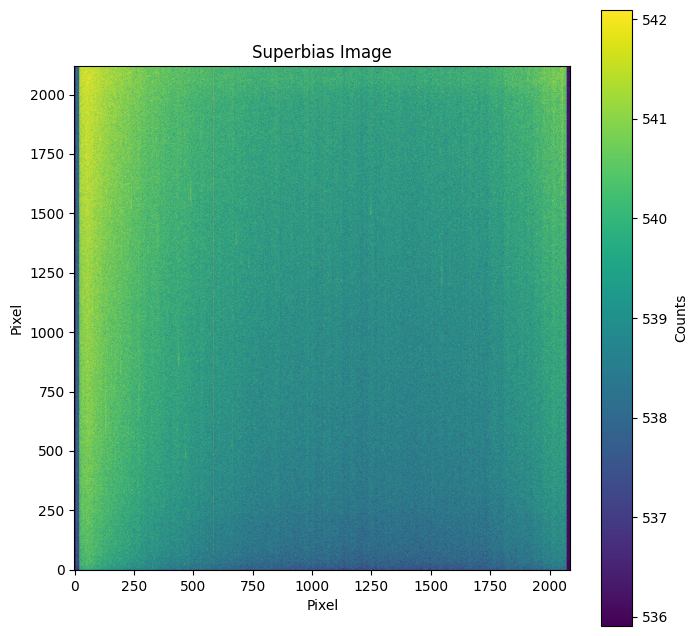

In [24]:
plt.figure("Superbias", figsize=(8, 8))
plt.imshow(
    superBias,
    vmin=np.median(superBias) - 0.1 * imstats(superBias)['desviation'], 
    vmax=np.median(superBias) + 0.1 * imstats(superBias)['desviation'],
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Superbias Image")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

# Superflat

We will take the average of the flats to obtain the global response of the detector and then divide the galaxy images by this average. In this way, we would be correcting proportional alterations in each area of the detector. For example, if we have a region where some pixels are twice as sensitive as others, they will detect twice the luminosity, so we divide by the superflat to eliminate variations and treat all pixels as if they had the same sensitivity.

As is obvious, there are two types of flats depending on the filter, just like with the galaxies, since the sensitivity may depend on the spectrum.

## Superflat H$\alpha$

### Flats H$\alpha$ List

In [16]:
flatsNamesH = [
    file_flatH for file_flatH in flatsNames 
    if 'H' in fits.open(file_flatH)[0].header['OBJECT']
]
flatsH = [
    [
        file_flatHname, fits.open(file_flatHname)[0].header['OBJECT'], 
        imstats(fits.open(file_flatHname)[0].data-superBias)
    ] 
        for file_flatHname in flatsNamesH
]

In [17]:
print('Lista de Flats h:')
for item_flatH in flatsH:
    print(item_flatH)

Lista de Flats h:
['r326219.fits', 'FlatHa6607', {'total': 4426560, 'minimum': -63177.0, 'maximum': 22538.0, 'average': 9210.658668356466, 'median': 10838.0, 'desviation': 3928.988124076738}]
['r326220.fits', 'FlatHa6607', {'total': 4426560, 'minimum': -63204.0, 'maximum': 17906.0, 'average': 7319.191842649823, 'median': 8614.0, 'desviation': 3122.4313543891826}]
['r326221.fits', 'FlatHa6607', {'total': 4426560, 'minimum': -63190.0, 'maximum': 14123.0, 'average': 5849.701192348009, 'median': 6885.0, 'desviation': 2496.5391014285583}]
['r326222.fits', 'FlatHa6607', {'total': 4426560, 'minimum': -63197.0, 'maximum': 19296.0, 'average': 7909.541081110388, 'median': 9310.0, 'desviation': 3372.8133119844383}]
['r326223.fits', 'FlatHa6607', {'total': 4426560, 'minimum': -63195.0, 'maximum': 24140.0, 'average': 10272.48567036254, 'median': 12090.0, 'desviation': 4379.2038683595865}]
['r326310.fits', 'FaltAmaHa6607', {'total': 4426560, 'minimum': -62603.0, 'maximum': 24533.0, 'average': 10535.

Since we are only interested in the central part, we normalize by this region. Additionally, it is important to note that the edges are influenced by the shape of the filter (square for H$\alpha$ and circular for R), which affects the pixel values and the statistical data of the image.

In [18]:
flatsH_concat = [
    fits.open(flats_item)[0].data - superBias 
    for flats_item in flatsNamesH
]
squaresHa = [
    fits.open(square_item)[0].data [300:-300, 300:-300] 
    for square_item in flatsNamesH
]
flatsH_norm_concat = [
    data_flat / imstats(squareH)['median'] 
    for data_flat,squareH in zip(flatsH_concat, squaresHa)
]

We calculate the median of the flats.

In [19]:
superflatH = np.nanmedian(flatsH_norm_concat, axis=0)

We save the superflat.

In [20]:
hdu_superflatH = fits.PrimaryHDU(superflatH.astype(np.float32))
hdu_superflatH.writeto('superFlatH.fits', overwrite=True)

We plot the H$\alpha$ superflat.

In [25]:
plt.figure("Superflat H", figsize=(8 ,8))
plt.imshow(
    superflatH, 
    vmin=np.median(superflatH) - 0.7 * imstats(superflatH)['desviation'], 
    vmax=np.median(superflatH) + 0.7 * imstats(superflatH)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Superflat H")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

NameError: name 'superflatH' is not defined

<Figure size 800x800 with 0 Axes>

## Superflat R

We do the same as for H$\alpha$.

### Flats R List

In [22]:
flatsNamesr = [
    file_flatr for file_flatr in flatsNames 
    if 'r' in fits.open(file_flatr)[0].header['OBJECT']
]
flatsr = [
    [
        file_flatrname, fits.open(file_flatrname)[0].header['OBJECT'], 
        imstats(fits.open(file_flatrname)[0].data - superBias)
    ] 
         for file_flatrname in flatsNamesr
]

In [23]:
print('Lista de Flats r:')
for item_flatr in flatsr:
    print(item_flatr)

Lista de Flats r:
['r326229.fits', 'FlatrS', {'total': 4426560, 'minimum': -63212.0, 'maximum': 23318.0, 'average': 7944.228723433095, 'median': 10777.0, 'desviation': 4648.81904113308}]
['r326230.fits', 'FlatrS', {'total': 4426560, 'minimum': -63160.0, 'maximum': 24750.0, 'average': 9193.274735234583, 'median': 12477.0, 'desviation': 5377.7183472909}]
['r326231.fits', 'FlatrS', {'total': 4426560, 'minimum': -63191.0, 'maximum': 24620.0, 'average': 8747.815641039542, 'median': 11876.0, 'desviation': 5119.664269734501}]
['r326232.fits', 'FlatrS', {'total': 4426560, 'minimum': -63187.0, 'maximum': 25143.0, 'average': 11639.18557886937, 'median': 15798.0, 'desviation': 6804.3590649087055}]
['r326233.fits', 'FlatrS', {'total': 4426560, 'minimum': -63162.0, 'maximum': 24531.0, 'average': 8655.409129436854, 'median': 11746.0, 'desviation': 5063.625637361344}]
['r326234.fits', 'FlatrS', {'total': 4426560, 'minimum': -63178.0, 'maximum': 16124.0, 'average': 5422.702089206969, 'median': 7359.0,

In [24]:
flatsr_concat = [
    fits.open(flats_item)[0].data - superBias 
    for flats_item in flatsNamesr
]
squaresr = [
    fits.open(square_item)[0].data [300:-300, 300:-300] 
    for square_item in flatsNamesr
]
flatsr_concat_norm = [
    data_flat / imstats(square)['median'] 
    for data_flat, square in zip(flatsr_concat, squaresr)
]

In [25]:
superflatr = np.nanmedian(flatsr_concat_norm, axis=0)

In [26]:
hdu_superflatr = fits.PrimaryHDU(superflatr.astype(np.float32))
hdu_superflatr.writeto('superFlatr.fits', overwrite=True)

In [26]:
plt.figure("Superflat r", figsize=(8, 8))
plt.imshow(
    superflatr, 
    vmin=np.median(superflatr) - 0.6 * imstats(superflatr)['desviation'], 
    vmax=np.median(superflatr) + 0.6 * imstats(superflatr)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Superflat R")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

NameError: name 'superflatr' is not defined

<Figure size 800x800 with 0 Axes>

# Supergalaxy

In this section, we will integrate the galaxy images for each band. This is where we will remove the cosmic rays, subtract the superbias, divide by the corresponding superflat, remove the sky light, adjust for the exposure time, and eliminate the defective pixel lines from the CCD.

But first, we will create a list of the galaxies for each band and visualize an uncorrected galaxy.

## Galaxies H$\alpha$ list 

In [28]:
cigNamesH = [
    file_cigH for file_cigH in cigNames 
    if 'cig0736Ha' in fits.open(file_cigH)[0].header['OBJECT']
]

cigH = [
    [
        file_cigHname, fits.open(file_cigHname)[0].header['OBJECT'], 
        imstats(fits.open(file_cigHname)[0].data)
    ] 
         for file_cigHname in cigNamesH
]

In [29]:
print('Lista de galaxy H:')
for item_cigH in cigH:
    print(item_cigH)

Lista de galaxy H:
['r326249.fits', 'cig0736Ha6607', {'total': 4426560, 'minimum': 509.0, 'maximum': 65535.0, 'average': 553.2171519193233, 'median': 553.0, 'desviation': 87.19728709747316}]
['r326250.fits', 'cig0736Ha6607', {'total': 4426560, 'minimum': 515.0, 'maximum': 63558.0, 'average': 553.7231107225475, 'median': 554.0, 'desviation': 91.63862022757553}]
['r326251.fits', 'cig0736Ha6607', {'total': 4426560, 'minimum': 513.0, 'maximum': 64288.0, 'average': 553.8440814085882, 'median': 554.0, 'desviation': 80.71168950236873}]
['r326252.fits', 'cig0736Ha6607', {'total': 4426560, 'minimum': 508.0, 'maximum': 65535.0, 'average': 553.9128040735922, 'median': 554.0, 'desviation': 74.99333110951987}]


## Galaxies R list

In [30]:
cigNamesr = [
    file_cigr for file_cigr in cigNames 
    if 'cig0736r' in fits.open(file_cigr)[0].header['OBJECT']
]

cigr = [
    [
        file_cigrname, fits.open(file_cigrname)[0].header['OBJECT'], 
        imstats(fits.open(file_cigrname)[0].data)
    ]
        for file_cigrname in cigNamesr
]

In [31]:
print('Lista de galaxy r:')
for item_cigr in cigr:
    print(item_cigr)

Lista de galaxy r:
['r326245.fits', 'cig0736r', {'total': 4426560, 'minimum': 510.0, 'maximum': 65535.0, 'average': 689.7721955649533, 'median': 736.0, 'desviation': 264.29649531778097}]
['r326246.fits', 'cig0736r', {'total': 4426560, 'minimum': 511.0, 'maximum': 65535.0, 'average': 690.0315195095062, 'median': 736.0, 'desviation': 260.1432865916156}]
['r326247.fits', 'cig0736r', {'total': 4426560, 'minimum': 510.0, 'maximum': 65535.0, 'average': 683.5091691968481, 'median': 728.0, 'desviation': 257.55819054077665}]
['r326248.fits', 'cig0736r', {'total': 4426560, 'minimum': 512.0, 'maximum': 65535.0, 'average': 680.4435134732162, 'median': 723.0, 'desviation': 246.99515008827655}]


## Original galaxy images

We will plot the original galaxies in order to compare them with the final result. We will use galaxy_concat to store the data of the galaxies from each band.

In [32]:
galaxyH_concat = [
    fits.open(galaxy)[0].data for galaxy in cigNamesH
]

In [33]:
galaxyr_concat = [
    fits.open(galaxy)[0].data for galaxy in cigNamesr
]

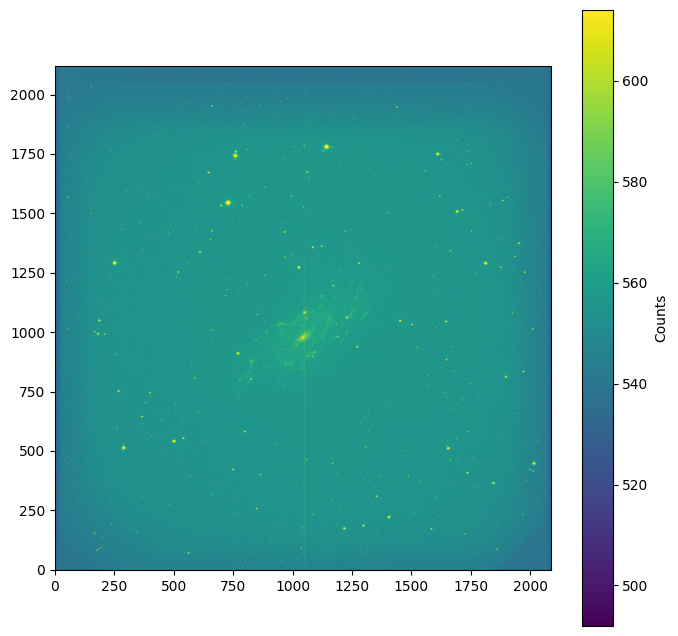

In [34]:
plt.figure("cig0736Ha6607", figsize=(8, 8))
plt.imshow(
    galaxyH_concat[0], 
    vmin=np.median(galaxyH_concat[0]) - 0.7 * imstats(galaxyH_concat[0])['desviation'], 
    vmax=np.median(galaxyH_concat[0]) + 0.7 * imstats(galaxyH_concat[0])['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Galaxy H-alpha 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

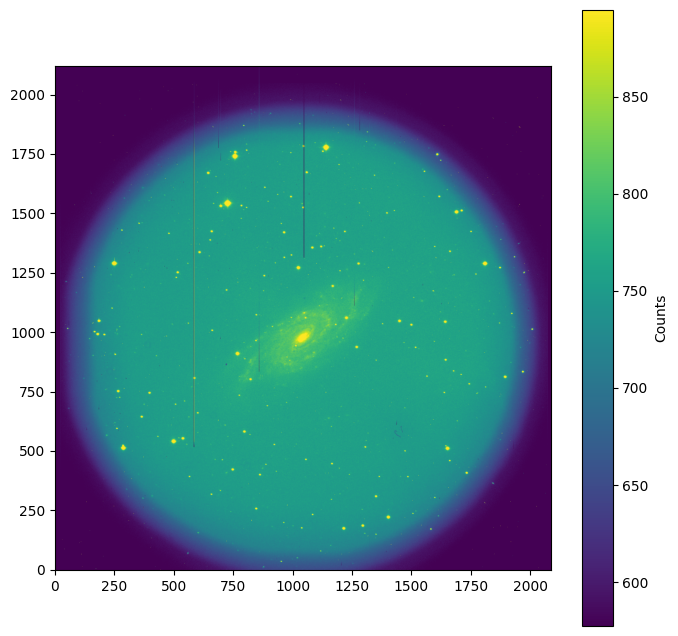

In [35]:
plt.figure("galaxy r 1", figsize=(8, 8))
plt.imshow(
    galaxyr_concat[0], 
    vmin=np.median(galaxyr_concat[0]) - 0.6 * imstats(galaxyr_concat[0])['desviation'], 
    vmax=np.median(galaxyr_concat[0]) + 0.6 * imstats(galaxyr_concat[0])['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Galaxy R 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

## Cosmic Rays Subtraction 

https://lacosmic.readthedocs.io/en/stable/api/lacosmic.lacosmic.html#lacosmic.lacosmic

The CCD is sensitive to cosmic rays that strike it, causing the pixels to become saturated. These rays can be removed using a function in *Astropy*.

### Cosmic rays of galaxies H$\alpha$

We create a loop to correct all the images, and as they are corrected, they are saved for later use. Care must be taken with the parameters chosen, as they may remove parts of the galaxy itself.

In [36]:
for i, galHa_clean in enumerate(galaxyH_concat):
    galHa_clean, galHa_mask = lacosmic.lacosmic(
        galHa_clean.astype(np.float32),
        contrast=2, 
        cr_threshold=20, 
        neighbor_threshold=10, 
        effective_gain=10, 
        readnoise=0
    )
    hdu_galaxy_raysh = fits.PrimaryHDU(galHa_clean.astype(np.float32))
    hdu_galaxy_raysh.writeto(f'galaxyHa_rays_{i}.fits', overwrite=True)
    
    hdu_maskHa = fits.PrimaryHDU(galHa_mask.astype(np.float32))
    hdu_maskHa.writeto(f'maskHa_rays_{i}.fits', overwrite=True)

INFO: Iteration 1: Found 2554 cosmic-ray pixels, Total: 2554 [lacosmic.core]
INFO: Iteration 2: Found 146 cosmic-ray pixels, Total: 2700 [lacosmic.core]
INFO: Iteration 3: Found 4 cosmic-ray pixels, Total: 2704 [lacosmic.core]
INFO: Iteration 4: Found 0 cosmic-ray pixels, Total: 2704 [lacosmic.core]
INFO: Iteration 1: Found 2659 cosmic-ray pixels, Total: 2659 [lacosmic.core]
INFO: Iteration 2: Found 110 cosmic-ray pixels, Total: 2769 [lacosmic.core]
INFO: Iteration 3: Found 4 cosmic-ray pixels, Total: 2773 [lacosmic.core]
INFO: Iteration 4: Found 0 cosmic-ray pixels, Total: 2773 [lacosmic.core]
INFO: Iteration 1: Found 2753 cosmic-ray pixels, Total: 2753 [lacosmic.core]
INFO: Iteration 2: Found 118 cosmic-ray pixels, Total: 2871 [lacosmic.core]
INFO: Iteration 3: Found 3 cosmic-ray pixels, Total: 2874 [lacosmic.core]
INFO: Iteration 4: Found 0 cosmic-ray pixels, Total: 2874 [lacosmic.core]
INFO: Iteration 1: Found 2556 cosmic-ray pixels, Total: 2556 [lacosmic.core]
INFO: Iteration 2: F

We update the list to include in *fileList* the *fits* files saved previously.

In [37]:
fileList = sorted(glob.glob('*fits'))

We open the *fits* files we have saved, both the galaxy with the corrected cosmic rays and the mask where the cosmic rays are identified.

In [38]:
galaxynamesHa_rays = [
    file_galh_ray for file_galh_ray in fileList 
    if 'galaxyHa_rays' in file_galh_ray
]
galaxyH_concat_rays = [
    fits.open(galh_ray_item)[0].data 
    for galh_ray_item in galaxynamesHa_rays
]

In [39]:
masknamesHa = [
    file_maskh for file_maskh in fileList 
    if 'maskHa_rays' in file_maskh
]
maskHa_concat = [
    fits.open(maskh_item)[0].data 
    for maskh_item in masknamesHa
]

We plot the galaxy and the mask.

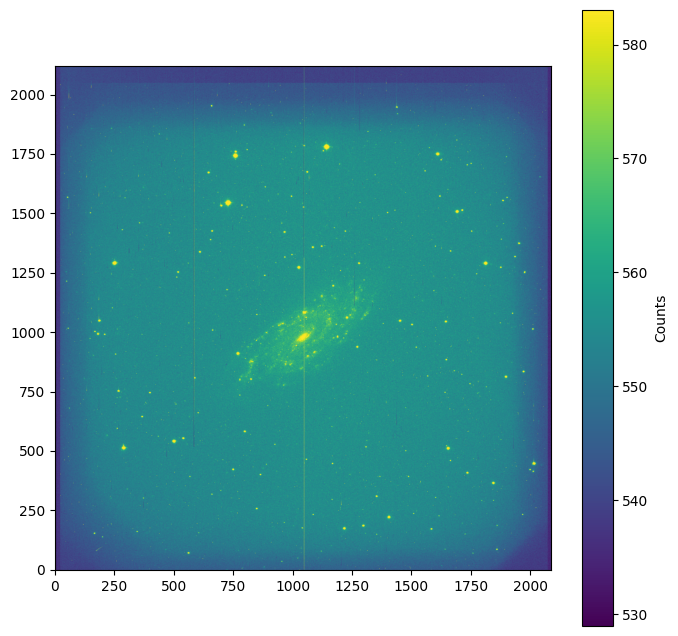

In [40]:
plt.figure("galaxy Ha clean rays 1", figsize=(8, 8))
plt.imshow(
    galaxyH_concat_rays[0], 
    vmin=np.median(galaxyH_concat_rays[0][300:-300, 300:-300]) - 0.6 * imstats(galaxyH_concat_rays[0][300:-300, 300:-300])['desviation'], 
    vmax=np.median(galaxyH_concat_rays[0][300:-300, 300:-300]) + 0.6 * imstats(galaxyH_concat_rays[0][300:-300, 300:-300])['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Galaxy H-alpha cosmic rays 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

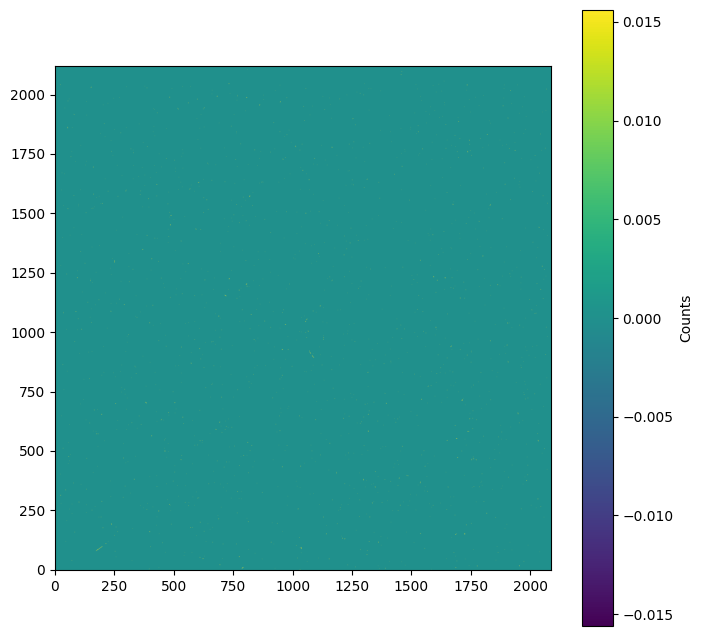

In [41]:
plt.figure("mask Ha 1", figsize=(8, 8))
plt.imshow(
    maskHa_concat[0], 
    vmin=np.median(maskHa_concat[0][300:-300, 300:-300]) - 0.6 * imstats(maskHa_concat[0][300:-300, 300:-300])['desviation'], 
    vmax=np.median(maskHa_concat[0][300:-300, 300:-300]) + 0.6 * imstats(maskHa_concat[0][300:-300, 300:-300])['desviation'],  
    origin="lower")
plt.colorbar(label="Counts")
plt.title("mask H-alpha 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

### Cosmic rays of galaxies R

We repeat the same procedure as for H$\alpha$.

In [42]:
for i, galr_clean in enumerate(galaxyr_concat):
    galr_clean, galr_mask = lacosmic.lacosmic(
        galr_clean.astype(np.float32), 
        contrast=2, 
        cr_threshold=20, 
        neighbor_threshold=10, 
        effective_gain=10, 
        readnoise=0
    )
    hdu_galaxy_raysr = fits.PrimaryHDU(galr_clean.astype(np.float32))
    hdu_galaxy_raysr.writeto(f'galaxyr_rays_{i}.fits', overwrite=True)
    
    hdu_maskr = fits.PrimaryHDU(galr_mask.astype(np.float32))
    hdu_maskr.writeto(f'maskr_rays_{i}.fits', overwrite=True)

INFO: Iteration 1: Found 793 cosmic-ray pixels, Total: 793 [lacosmic.core]
INFO: Iteration 2: Found 73 cosmic-ray pixels, Total: 866 [lacosmic.core]
INFO: Iteration 3: Found 31 cosmic-ray pixels, Total: 897 [lacosmic.core]
INFO: Iteration 4: Found 29 cosmic-ray pixels, Total: 926 [lacosmic.core]
INFO: Iteration 1: Found 809 cosmic-ray pixels, Total: 809 [lacosmic.core]
INFO: Iteration 2: Found 56 cosmic-ray pixels, Total: 865 [lacosmic.core]
INFO: Iteration 3: Found 27 cosmic-ray pixels, Total: 892 [lacosmic.core]
INFO: Iteration 4: Found 18 cosmic-ray pixels, Total: 910 [lacosmic.core]
INFO: Iteration 1: Found 749 cosmic-ray pixels, Total: 749 [lacosmic.core]
INFO: Iteration 2: Found 40 cosmic-ray pixels, Total: 789 [lacosmic.core]
INFO: Iteration 3: Found 6 cosmic-ray pixels, Total: 795 [lacosmic.core]
INFO: Iteration 4: Found 6 cosmic-ray pixels, Total: 801 [lacosmic.core]
INFO: Iteration 1: Found 722 cosmic-ray pixels, Total: 722 [lacosmic.core]
INFO: Iteration 2: Found 30 cosmic-r

In [43]:
fileList = sorted(glob.glob('*fits'))

In [44]:
galaxynamesr_rays = [
    file_galr_ray for file_galr_ray in fileList 
    if 'galaxyr_rays' in file_galr_ray
]
galaxyr_concat_rays = [
    fits.open(galr_ray_item)[0].data 
    for galr_ray_item in galaxynamesr_rays
]

In [45]:
masknamesr = [
    file_maskr for file_maskr in fileList 
    if 'maskr_rays' in file_maskr
]
maskr_concat = [
    fits.open(maskr_item)[0].data 
    for maskr_item in masknamesr
]

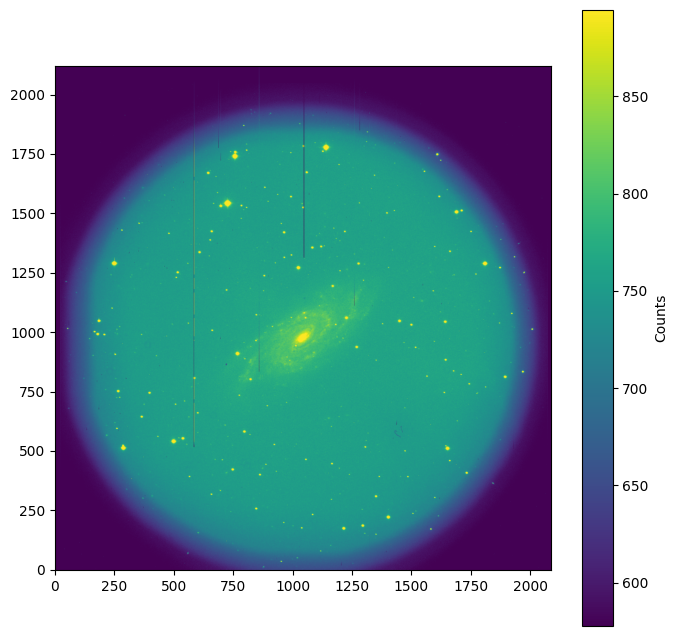

In [46]:
plt.figure("galaxy r clean rays 1", figsize=(8, 8))
plt.imshow(
    galaxyr_concat_rays[0], 
    vmin=np.median(galaxyr_concat_rays[0])-0.6*imstats(galaxyr_concat_rays[0])['desviation'], 
    vmax=np.median(galaxyr_concat_rays[0])+0.6*imstats(galaxyr_concat_rays[0])['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Galaxy R cosmic rays 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

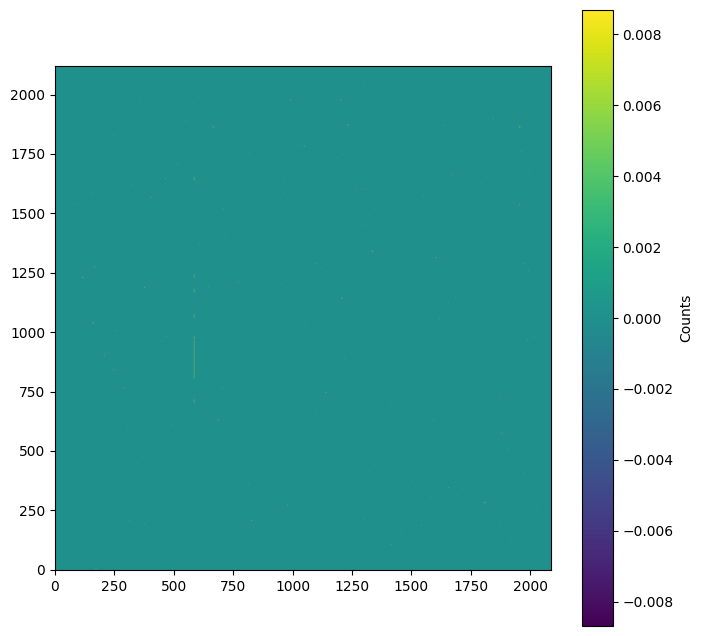

In [47]:
plt.figure("mask r 1", figsize=(8,8))
plt.imshow(
    maskr_concat[0], 
    vmin=np.median(maskr_concat[0]) - 0.6 * imstats(maskr_concat[0])['desviation'], 
    vmax=np.median(maskr_concat[0]) + 0.6 * imstats(maskr_concat[0])['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Mask R 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

## Subtract Superbias

We subtract the superbias from each galaxy to remove the noise from the instrument itself.

In [48]:
galaxyH_concat_sb = [
    fits.open(galh_sb_item)[0].data - superBias 
    for galh_sb_item in galaxynamesHa_rays
]

In [49]:
galaxyr_concat_sb = [
    fits.open(galr_sb_item)[0].data - superBias 
    for galr_sb_item in galaxynamesr_rays
]

We plot a galaxy from each band to see how the pixel values have effectively decreased.

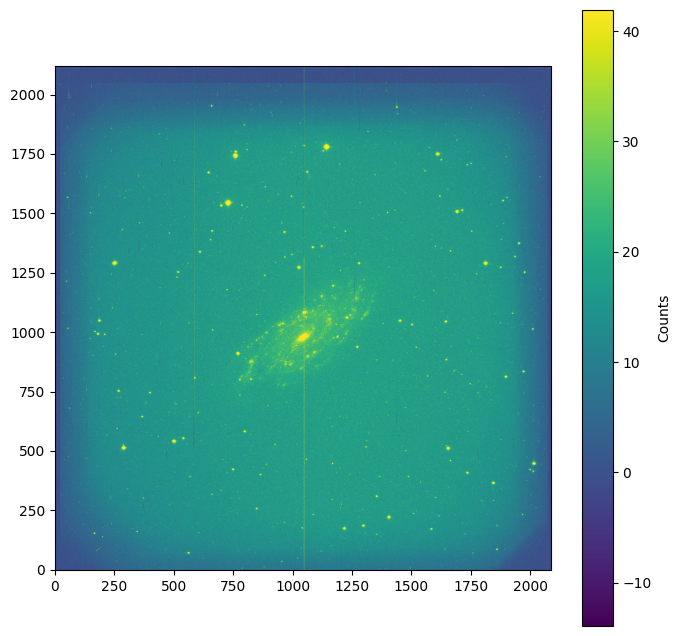

In [50]:
plt.figure("galaxy Ha superbias 1", figsize=(8, 8))
plt.imshow(
    galaxyH_concat_sb[0], 
    vmin=np.median(galaxyH_concat_sb[0]) - 0.6 * imstats(galaxyH_concat_sb[0])['desviation'], 
    vmax=np.median(galaxyH_concat_sb[0]) + 0.6 * imstats(galaxyH_concat_sb[0])['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Galaxy H-alpha 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

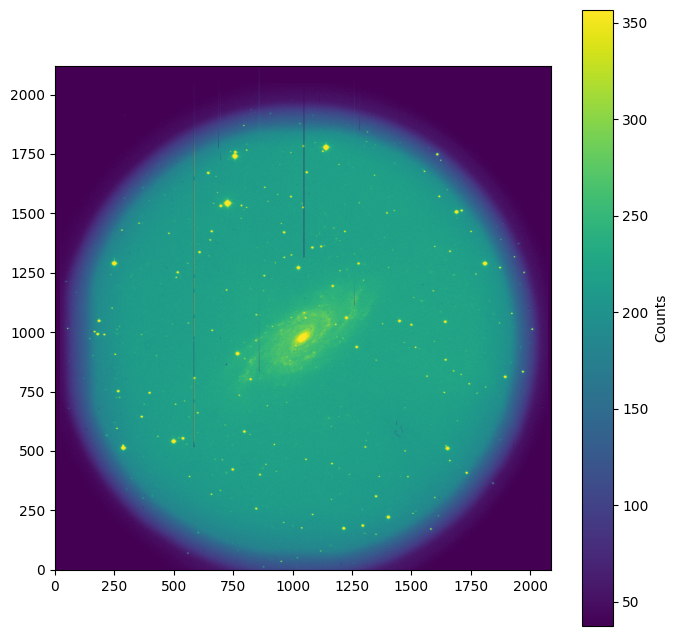

In [51]:
plt.figure("galaxy r superbias 1", figsize=(8, 8))
plt.imshow(
    galaxyr_concat_sb[0], 
    vmin=np.median(galaxyr_concat_sb[0]) - 0.6 * imstats(galaxyr_concat_sb[0])['desviation'], 
    vmax=np.median(galaxyr_concat_sb[0]) + 0.6 * imstats(galaxyr_concat_sb[0])['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Galaxy R 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

## Divide by Superflat

The detector does not respond uniformly across all its areas; some pixels are more sensitive than others, some reach their saturation point due to bright objects, and there may also be variation in luminosity due to the atmosphere. All of this contributes to an alteration in the observation, but it can be corrected by the superflat.

In [52]:
galaxyH_concat_sf = [
    galh_sf_item / superflatH 
    for galh_sf_item in galaxyH_concat_sb
]

/tmp/ipykernel_4195/3598830412.py:2: RuntimeWarning: divide by zero encountered in divide
  galh_sf_item / superflatH
/tmp/ipykernel_4195/3598830412.py:2: RuntimeWarning: invalid value encountered in divide
  galh_sf_item / superflatH


In [53]:
galaxyr_concat_sf = [
    galr_sf_item / superflatr 
    for galr_sf_item in galaxyr_concat_sb
]

/tmp/ipykernel_4195/3534844753.py:2: RuntimeWarning: divide by zero encountered in divide
  galr_sf_item / superflatr
/tmp/ipykernel_4195/3534844753.py:2: RuntimeWarning: invalid value encountered in divide
  galr_sf_item / superflatr


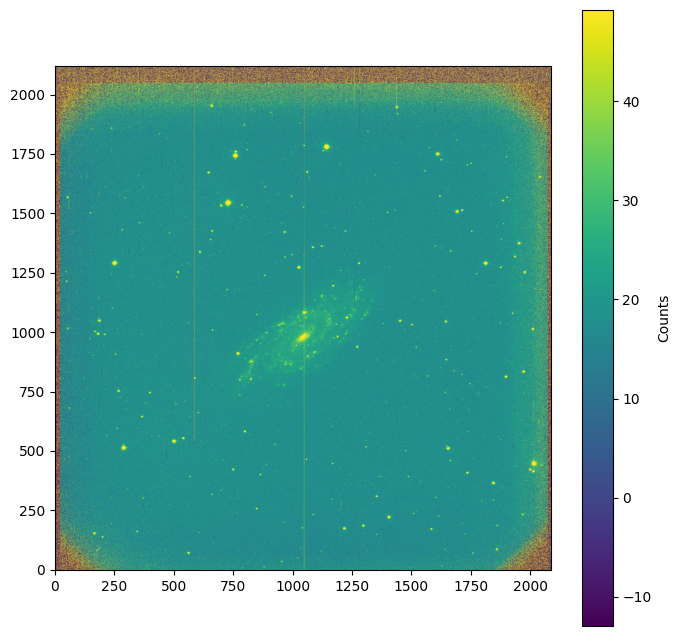

In [54]:
galaxyH_plot_sf = galaxyH_concat_sf[0][300:-300, 300:-300]

plt.figure("galaxy Ha superflat 1", figsize=(8, 8))   
plt.imshow(
    galaxyH_concat_sf[0], 
    vmin=imstats(galaxyH_plot_sf)['median'] - 0.6 * imstats(galaxyH_plot_sf)['desviation'], 
    vmax=imstats(galaxyH_plot_sf)['median'] + 0.6 * imstats(galaxyH_plot_sf)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Galaxy H-alpha 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

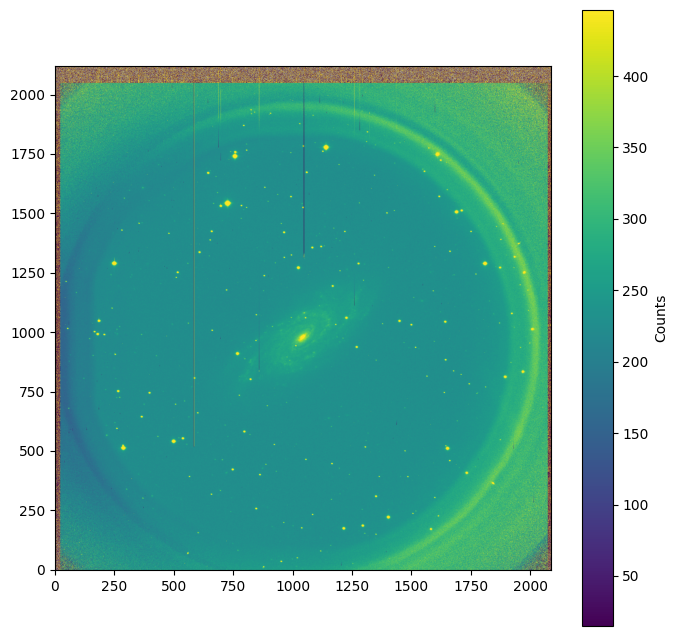

In [55]:
galaxyr_plot_sf = galaxyr_concat_sf[0][300:-300, 300:-300]

plt.figure("galaxy r superflat 1", figsize=(8, 8))
plt.imshow(
    galaxyr_concat_sf[0], 
    vmin=imstats(galaxyr_plot_sf)['median'] - 0.6 * imstats(galaxyr_plot_sf)['desviation'], 
    vmax=imstats(galaxyr_plot_sf)['median'] + 0.6 * imstats(galaxyr_plot_sf)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Galaxy R 1")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

## Delete Background

https://photutils.readthedocs.io/en/stable/user_guide/background.html#

The light coming from the Moon largely constitutes the sky light that prevents us from distinguishing details of the objects we are studying.
Therefore, it is useful to make an estimation of all that light which does not come, in this case, from the galaxy we are observing, in order to remove it. For this task, we will use *photutils*.

### Background of galaxies H$\alpha$

Using the photutils tool, we need to apply a mask to everything that is not stars or the galaxy, in order to only remove the sky light and not affect the rest. As we correct the image, we save the corrected fits file of the sky light.

In [56]:
for i, galh_bg in enumerate(galaxyH_concat_sf):
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
    threshold = detect_threshold(galh_bg, nsigma=2.0, sigma_clip=sigma_clip)
    segment_img = detect_sources(galh_bg, threshold, npixels=10)
    footprint = circular_footprint(radius=10)
    maskh_bg = segment_img.make_source_mask(footprint=footprint)
    mean, median, std = sigma_clipped_stats(galh_bg, sigma=3.0, mask=maskh_bg)
    galh_bg = galh_bg - mean
    hdu_galHaBG = fits.PrimaryHDU(galh_bg.astype(np.float32))
    hdu_galHaBG.writeto(f'galaxyHa_bg_{i}.fits', overwrite=True)

    hdu_maskHaBG = fits.PrimaryHDU(maskh_bg.astype(np.float32))
    hdu_maskHaBG.writeto(f'maskHa_bg_{i}.fits', overwrite=True)

We update the list.

In [57]:
fileList = sorted(glob.glob('*fits'))

In [58]:
galaxynamesHa_bg = [
    file_galh_bg for file_galh_bg in fileList 
    if 'galaxyHa_bg' in file_galh_bg
]
galaxyH_concat_bg = [
    fits.open(galh_bg_item)[0].data 
    for galh_bg_item in galaxynamesHa_bg
]

In [59]:
maskH_concat_bg = [
    fits.open(maskh_bg_item)[0].data 
    for maskh_bg_item in fileList
    if 'maskHa_bg' in maskh_bg_item
]

We plot a galaxy and the mask.

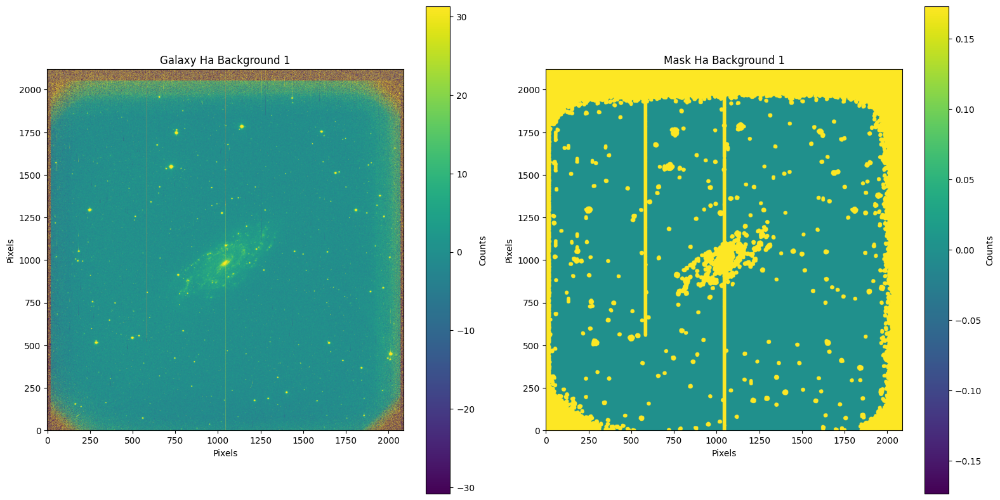

In [62]:
galaxyH_plot_bg = galaxyH_concat_bg[0][300:-300, 300:-300]
maskH_plot_bg = maskH_concat_bg[0][300:-300, 300:-300]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
figure1 = ax1.imshow(
    galaxyH_concat_bg[0], 
    vmin=imstats(galaxyH_plot_bg)['median'] - 0.6 * imstats(galaxyH_plot_bg)['desviation'], 
    vmax=imstats(galaxyH_plot_bg)['median'] + 0.6 * imstats(galaxyH_plot_bg)['desviation'],  
    origin="lower"
)
ax1.set_title("Galaxy Ha Background 1")
ax1.set_xlabel("Pixels")
ax1.set_ylabel("Pixels")
fig.colorbar(figure1, ax=ax1, label="Counts")

figure2 = ax2.imshow(
    maskH_concat_bg[0], 
    vmin=imstats(maskH_plot_bg)['median'] - 0.6 * imstats(maskH_plot_bg)['desviation'], 
    vmax=imstats(maskH_plot_bg)['median'] + 0.6 * imstats(maskH_plot_bg)['desviation'],  
    origin="lower"
)
ax2.set_title("Mask Ha Background 1")
ax2.set_xlabel("Pixels")
ax2.set_ylabel("Pixels")
fig.colorbar(figure2, ax=ax2, label="Counts")

plt.tight_layout()
plt.show()


### Background of galaxies R

We perform the same procedure as for H$\alpha$.

In [63]:
for i, galr_bg in enumerate(galaxyr_concat_sf):
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
    threshold = detect_threshold(galr_bg, nsigma=2.0, sigma_clip=sigma_clip)
    segment_img = detect_sources(galr_bg, threshold, npixels=10)
    footprint = circular_footprint(radius=10)
    maskr_bg = segment_img.make_source_mask(footprint=footprint)
    mean, median, std = sigma_clipped_stats(galr_bg, sigma=3.0, mask=maskr_bg)
    galr_bg = galr_bg - mean
    hdu_galrBG=fits.PrimaryHDU(galr_bg.astype(np.float32))
    hdu_galrBG.writeto(f'galaxyr_bg_{i}.fits', overwrite=True)

    hdu_maskrBG = fits.PrimaryHDU(maskr_bg.astype(np.float32))
    hdu_maskrBG.writeto(f'maskr_bg_{i}.fits', overwrite=True)

In [64]:
fileList = sorted(glob.glob('*fits'))

In [65]:
galaxynamesr_bg = [
    file_galr_bg for file_galr_bg in fileList 
    if 'galaxyr_bg' in file_galr_bg
]
galaxyr_concat_bg = [
    fits.open(galr_bg_item)[0].data 
    for galr_bg_item in galaxynamesr_bg
]

In [66]:
maskr_concat_bg = [
    fits.open(maskr_bg_item)[0].data 
    for maskr_bg_item in fileList
    if 'maskr_bg' in maskr_bg_item
]

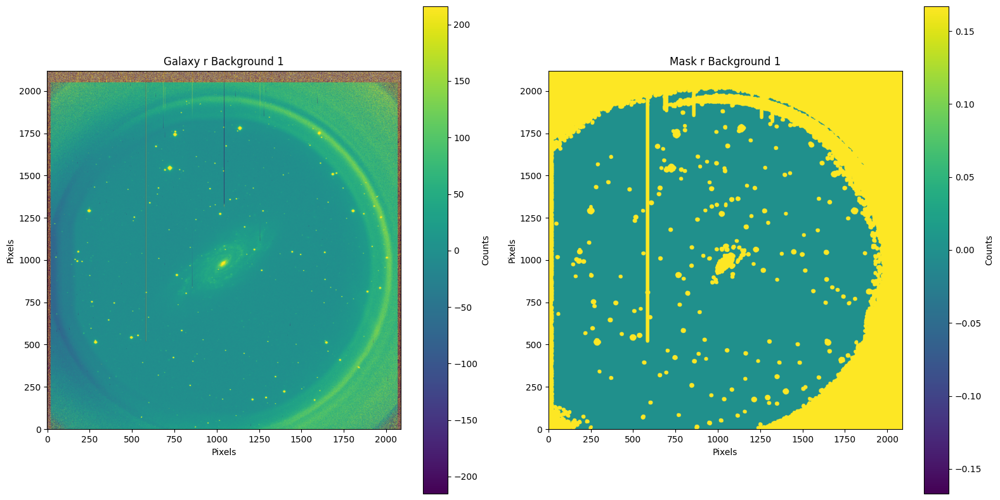

In [67]:
galaxyr_plot_bg = galaxyr_concat_bg[0][300:-300, 300:-300]
maskr_bg_plot = maskr_concat_bg[0][300:-300, 300:-300]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))  
figure1 = ax1.imshow(
    galaxyr_concat_bg[0], 
    vmin=imstats(galaxyr_plot_bg)['median'] - 0.6 * imstats(galaxyr_plot_bg)['desviation'], 
    vmax=imstats(galaxyr_plot_bg)['median'] + 0.6 * imstats(galaxyr_plot_bg)['desviation'],  
    origin="lower"
)
ax1.set_title("Galaxy r Background 1")
ax1.set_xlabel("Pixels")
ax1.set_ylabel("Pixels")
fig.colorbar(figure1, ax=ax1, label="Counts")
figure2 = ax2.imshow(
    maskr_concat_bg[0], 
    vmin=imstats(maskr_bg_plot)['median'] - 0.6 * imstats(maskr_bg_plot)['desviation'], 
    vmax=imstats(maskr_bg_plot)['median'] + 0.6 * imstats(maskr_bg_plot)['desviation'],  
    origin="lower"
)
ax2.set_title("Mask r Background 1")
ax2.set_xlabel("Pixels")
ax2.set_ylabel("Pixels")
fig.colorbar(figure2, ax=ax2, label="Counts")
plt.tight_layout()
plt.show()


## Exposure time

The longer the exposure time, the more photons we will collect from the objects we are observing. Therefore, to obtain information about the brightness of the object and also be able to compare it with other images, it is necessary to divide the pixel values by the exposure time.

In [68]:
galaxyH_concat_exptime = [
    fits.open(galh_ext_item)[0].data / 1200 
    for galh_ext_item in galaxynamesHa_bg
]

In [69]:
galaxyr_concat_exptime = [
    fits.open(galr_ext_item)[0].data / 300 
    for galr_ext_item in galaxynamesr_bg
]

## Lines Subtraction

We will now remove the lines caused by defective pixels in the filters. These lines appear in all the images, as has been observed, including the Bias and the Flats. Using a list called *badpix.lis* we will locate these lines in the galaxy images and, through interpolation, we will attempt to "erase" these lines by replacing them with values based on the surrounding area that more closely approximate reality. It is important to note that this list provides the first pixel (y1, x1) and the last pixel (y2, x2) of the line. Another thing to consider is that in Python, the indices start at 0, while in ds9, they start at 1.

### Lines in galaxies H$\alpha$

In [70]:
x1, x2, y1, y2 = np.loadtxt('badpix.lis', unpack=True)

In [71]:
for i, galh_lines in enumerate(galaxyH_concat_exptime):  # For each galaxy
    for j in range(len(x1)):                             # For each line
        x_1 = int(x1[j]-1)
        x_2 = int(x2[j]-1)
        y_1 = int(y1[j]-1)
        y_2 = int(y2[j]-1)
        for n in range(y_1, y_2+1):                      # Traverse the line.
            coord_x = list(range(x_1, x_2+1))
            coord_xp = [x_1-1, x_2+1]
            pixel_neigh = galh_lines[n, coord_xp]
            galh_lines[n, coord_x] = np.interp(
                coord_x, coord_xp, pixel_neigh
            )
    hdu_galHa_lines = fits.PrimaryHDU(
        galh_lines.astype(np.float32)
    )
    hdu_galHa_lines.writeto(f'galaxyHa_lines_{i}.fits', overwrite=True)

We update the list.

In [72]:
fileList = sorted(glob.glob('*fits'))

We open the saved *fits* files and store them in *galaxyH_concat_lines*.

In [73]:
galaxynamesHa_lines = [
    file_galh_lines for file_galh_lines in fileList 
    if 'galaxyHa_lines' in file_galh_lines
]
galaxyH_concat_lines = [
    fits.open(galh_lines_item)[0].data 
    for galh_lines_item in galaxynamesHa_lines
]

We check by plotting the galaxy to see how the lines have indeed been removed.

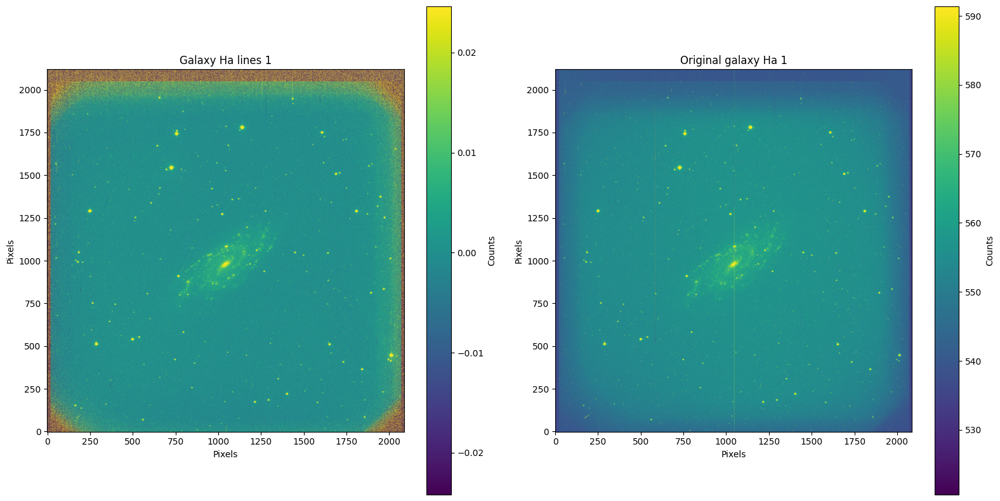

In [116]:
galaxyH_plot_lines = galaxyH_concat_lines[0][300:-300, 300:-300]
galaxyH_plot_original = galaxyH_concat[0][300:-300, 300:-300]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))  
figure1 = ax1.imshow(
    galaxyH_concat_lines[0], 
    vmin=imstats(galaxyH_plot_lines)['median'] - 0.6 * imstats(galaxyH_plot_lines)['desviation'], 
    vmax=imstats(galaxyH_plot_lines)['median'] + 0.6 * imstats(galaxyH_plot_lines)['desviation'],  
    origin="lower"
)
ax1.set_title("Galaxy Ha lines 1")
ax1.set_xlabel("Pixels")
ax1.set_ylabel("Pixels")
fig.colorbar(figure1, ax=ax1, label="Counts")
figure2 = ax2.imshow(
    galaxyH_concat[0], 
    vmin=np.median(galaxyH_plot_original) - 0.7 * imstats(galaxyH_plot_original)['desviation'], 
    vmax=np.median(galaxyH_plot_original) + 0.7 * imstats(galaxyH_plot_original)['desviation'],  
    origin="lower"
)
ax2.set_title("Original galaxy Ha 1")
ax2.set_xlabel("Pixels")
ax2.set_ylabel("Pixels")
fig.colorbar(figure2, ax=ax2, label="Counts")
plt.tight_layout()
plt.show()

### Lines in galaxies R

We follow the same procedure as for the H$\alpha$ galaxies.

In [75]:
for i, galr_lines in enumerate(galaxyr_concat_exptime):  # For each galaxy
    for j in range(len(x1)):                             # For each line
        x_1 = int(x1[j]-1)
        x_2 = int(x2[j]-1)
        y_1 = int(y1[j]-1)
        y_2 = int(y2[j]-1)
        for n in range(y_1, y_2+1):                      # Traverse the line.
            coord_x = list(range(x_1, x_2+1))
            coord_xp = [x_1-1, x_2+1]
            pixel_neigh = galr_lines[n, coord_xp]
            galr_lines[n, coord_x] = np.interp(
                coord_x, coord_xp, pixel_neigh
            )
    hdu_galr_lines = fits.PrimaryHDU(
        galr_lines.astype(np.float32)
    )
    hdu_galr_lines.writeto(f'galaxyr_lines_{i}.fits', overwrite=True)

In [76]:
fileList = sorted(glob.glob('*fits'))

In [77]:
galaxynamesr_lines = [
    file_galr_lines for file_galr_lines in fileList 
    if 'galaxyr_lines' in file_galr_lines
]
galaxyr_concat_lines = [
    fits.open(galr_lines_item)[0].data 
    for galr_lines_item in galaxynamesr_lines
]

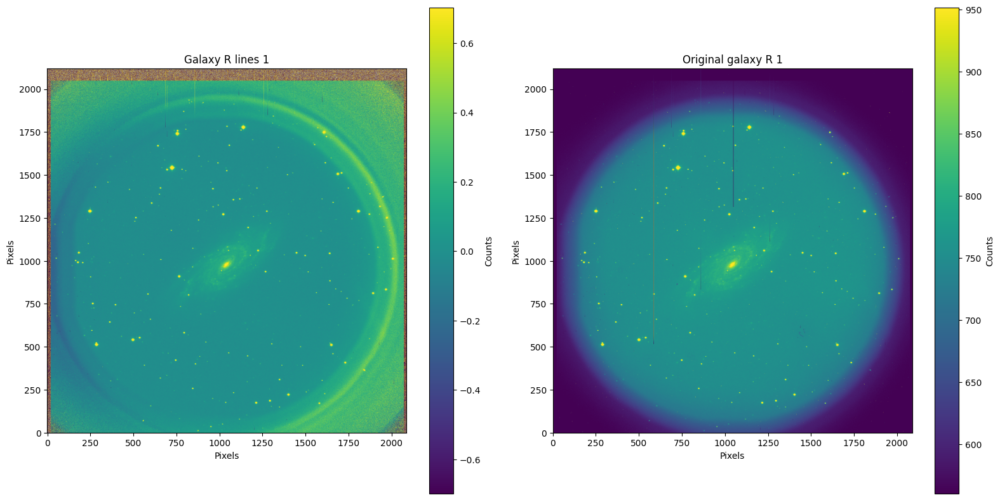

In [118]:
galaxyr_plot_lines = galaxyr_concat_lines[0][300:-300, 300:-300]
galaxyr_plot_original = galaxyr_concat[0][300:-300, 300:-300]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))  
figure1 = ax1.imshow(
    galaxyr_concat_lines[0], 
    vmin=imstats(galaxyr_plot_lines)['median'] - 0.6 * imstats(galaxyr_plot_lines)['desviation'], 
    vmax=imstats(galaxyr_plot_lines)['median'] + 0.6 * imstats(galaxyr_plot_lines)['desviation'],  
    origin="lower"
)
ax1.set_title("Galaxy R lines 1")
ax1.set_xlabel("Pixels")
ax1.set_ylabel("Pixels")
fig.colorbar(figure1, ax=ax1, label="Counts")
figure2 = ax2.imshow(
    galaxyr_concat[0], 
    vmin=imstats(galaxyr_plot_original)['median'] - 0.6 * imstats(galaxyr_plot_original)['desviation'], 
    vmax=imstats(galaxyr_plot_original)['median'] + 0.6 * imstats(galaxyr_plot_original)['desviation'],  
    origin="lower"
)
ax2.set_title("Original galaxy R 1")
ax2.set_xlabel("Pixels")
ax2.set_ylabel("Pixels")
fig.colorbar(figure2, ax=ax2, label="Counts")
plt.tight_layout()
plt.show()

## Supergalaxies R and H$\alpha$

Once the images are corrected for each band, we will combine them using the median of all of them, which will give us a single image for each band that we will call the **supergalaxy**.

In [79]:
supergalaxyH = np.median(galaxyH_concat_lines, axis=0)

/home/miguel/envAstro/lib/python3.11/site-packages/numpy/_core/_methods.py:135: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


In [80]:
supergalaxyr = np.median(galaxyr_concat_lines, axis=0)

We visualize each *supergalaxy*.

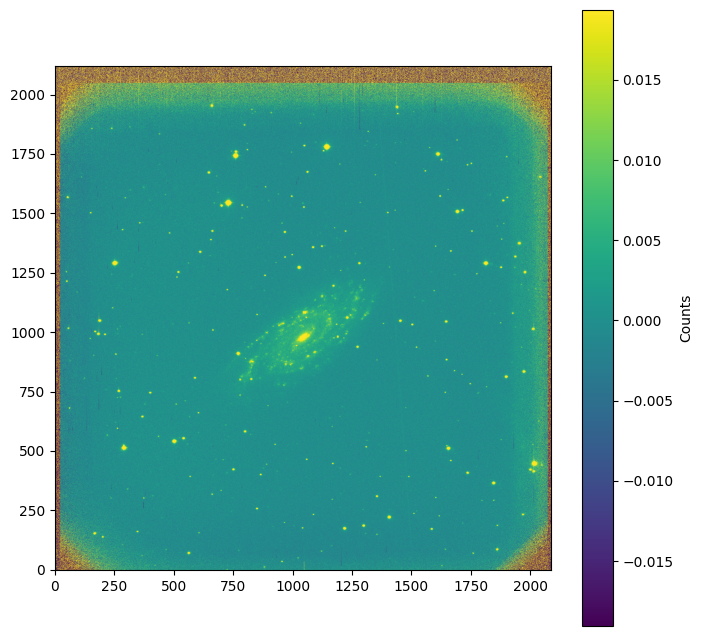

In [81]:
supergalaxyH_plot = supergalaxyH[300:-300, 300:-300]
plt.figure("Supergalaxy Ha", figsize=(8, 8))
plt.imshow(
    supergalaxyH, 
    vmin=imstats(supergalaxyH_plot)['median'] - 0.6 * imstats(supergalaxyH_plot)['desviation'], 
    vmax=imstats(supergalaxyH_plot)['median'] + 0.6 * imstats(supergalaxyH_plot)['desviation'],  
    origin="lower")
plt.colorbar(label="Counts")
plt.title("Supergalaxy H-alpha")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

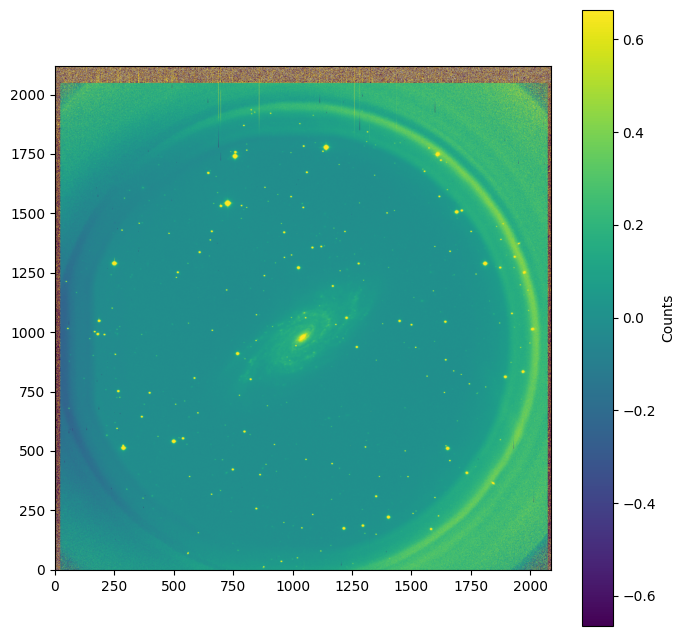

In [82]:
supergalaxyr_plot = supergalaxyr[300:-300, 300:-300]
plt.figure("Supergalaxy r", figsize=(8, 8))
plt.imshow(
    supergalaxyr, 
    vmin=imstats(supergalaxyr_plot)['median'] - 0.6 * imstats(supergalaxyr_plot)['desviation'], 
    vmax=imstats(supergalaxyr_plot)['median'] + 0.6 * imstats(supergalaxyr_plot)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Supergalaxy R")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

We save the *supergalaxy* images as we will now use them to remove the continuum from the H$\alpha$ image and thus obtain only the $\alpha$ line, and therefore the H II regions.

In [83]:
hdu_supergalaxyH = fits.PrimaryHDU(supergalaxyH.astype(np.float32))
hdu_supergalaxyH.writeto('supergalaxyHa.fits', overwrite=True)

In [84]:
hdu_supergalaxyr = fits.PrimaryHDU(supergalaxyr.astype(np.float32))
hdu_supergalaxyr.writeto('supergalaxyr.fits', overwrite=True)

# Superimage

From the two supergalaxy images, we will finally obtain the clean image of the galaxy with the H II regions. To do this, we will first obtain the flux of the stars in our galaxy in H$\alpha$, and then we will plot the linear relationship of the H$\alpha$ flux versus R and subtract from H$\alpha$ the R image multiplied by the slope of the linear regression.

## Star finder

https://photutils.readthedocs.io/en/stable/user_guide/detection.html

Since the R filter is a broadband that includes the H$\alpha$ filter, the stars we find in H$\alpha$ can necessarily be found in R. However, the reverse is not true; stars in R may not be present in the H$\alpha$ image. Therefore, we first obtain the flux of the stars in our galaxy in H$\alpha$ by masking the galaxy under study and setting conditions such as fwhm and threshold so that we have a flux of around ten to perform the linear regression.

In [119]:
galh_starfinder = supergalaxyH[300:-300, 300:-300]  
std = imstats(galh_starfinder)['desviation']
median = imstats(galh_starfinder)['median']
daofind = DAOStarFinder(fwhm=2.0, threshold=12.*std)
mask = np.zeros(galh_starfinder.shape, dtype=bool)
mask[450:-450, 450:-400] = True
sources = daofind(galh_starfinder - median, mask=mask)
for col in sources.colnames:  
    if col not in ('id', 'npix'):
        sources[col].info.format = '%.2f'  # for consistent table output
sources.pprint(max_width=76)

 id xcentroid ycentroid sharpness ...  peak  flux   mag  daofind_mag
--- --------- --------- --------- ... ----- ------ ----- -----------
  1   1352.29    211.85      0.61 ...  1.89  20.76 -3.29       -1.26
  2    200.91    241.68      0.57 ...  2.13  28.91 -3.65       -1.15
  3   1150.44    748.33      0.63 ...  0.68   7.19 -2.14       -0.18
  4   1389.84   1207.47      0.59 ...  1.90  22.25 -3.37       -1.23
  5    427.58   1244.40      0.55 ... 11.93 152.42 -5.46       -3.15
  6    458.07   1442.29      0.58 ...  6.24  76.34 -4.71       -2.47
  7   1308.31   1449.60      0.60 ...  2.09  23.65 -3.43       -1.35
  8    841.14   1479.97      0.60 ...  8.46  95.16 -4.95       -2.87


We obtain the positions of the stars and visualize them on the image using the *CircularAperture* function.

In [120]:
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
apertures = CircularAperture(positions, r=11.0)

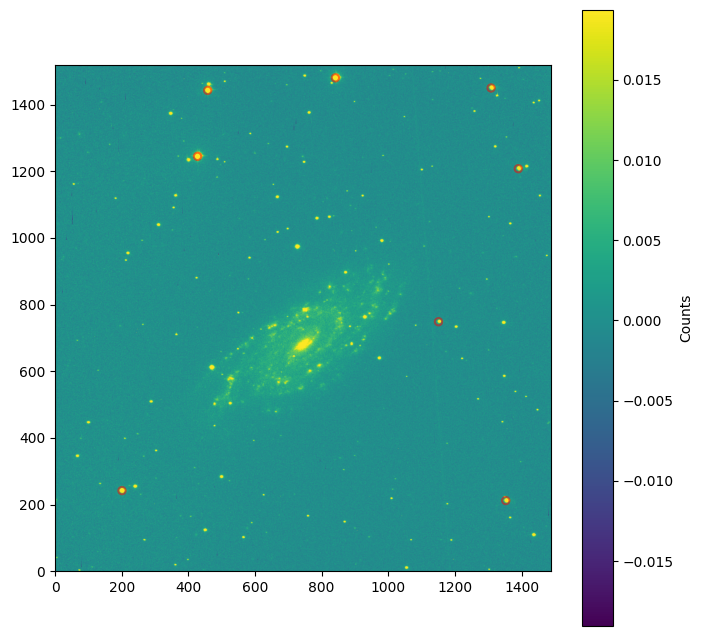

In [121]:
plt.figure("Supergalaxy Ha star finder", figsize=(8, 8))
plt.imshow(
    galh_starfinder, 
    vmin=np.median(galh_starfinder) - 0.6 * imstats(galh_starfinder)['desviation'],          
    vmax=np.median(galh_starfinder) + 0.6 * imstats(galh_starfinder)['desviation'],  
    origin="lower"
)
apertures.plot(color='red', lw=1.5, alpha=0.5)
plt.colorbar(label="Counts")
plt.title("Star finder H-alpha")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

We transfer the positions to the R image.

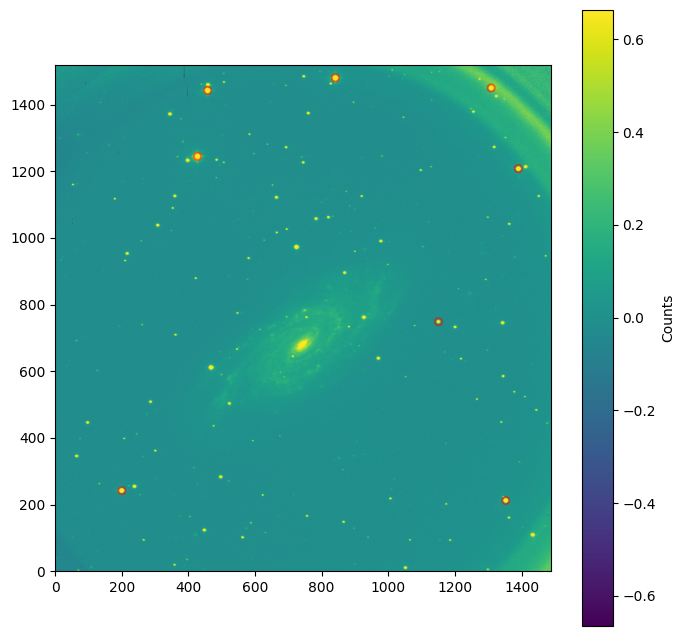

In [122]:
galr_starfinder = supergalaxyr[300:-300, 300:-300]  
plt.figure("Supergalaxy r star finder", figsize=(8, 8))
plt.imshow(
    galr_starfinder, 
    vmin=np.median(galr_starfinder) - 0.6 * imstats(galr_starfinder)['desviation'], 
    vmax=np.median(galr_starfinder) + 0.6 * imstats(galr_starfinder)['desviation'],  
    origin="lower"
)
apertures.plot(color='red', lw=1.5, alpha=0.5)
plt.colorbar(label="Counts")
plt.title("Star finder R")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

## Photometry

https://photutils.readthedocs.io/en/stable/user_guide/aperture.html

With the *aperture_photometry* function, we calculate the total flux of all the regions given by the apertures on the images.

In [123]:
photometryR = aperture_photometry(galr_starfinder, apertures)
photometryR

id,xcenter,ycenter,aperture_sum
int64,float64,float64,float64
1,1352.287106607611,211.85274444292168,1244.3101267258298
2,200.90968644743026,241.6800671616046,1735.0428698329206
3,1150.4351647270764,748.3307534689718,365.26135761867295
4,1389.8410895341387,1207.4723551151935,1363.2075455311567
5,427.57864056426246,1244.3964033737843,8593.597248254338
6,458.06747454785085,1442.286908100293,4131.643729700292
7,1308.3091165866865,1449.6018124519803,1317.6616576024776
8,841.1414368060174,1479.9727209107414,5138.978360810438


In [124]:
photometryH = aperture_photometry(galh_starfinder, apertures)
photometryH

id,xcenter,ycenter,aperture_sum
int64,float64,float64,float64
1,1352.287106607611,211.85274444292168,31.471570455337428
2,200.90968644743026,241.6800671616046,46.80734651641163
3,1150.4351647270764,748.3307534689718,10.706277834764684
4,1389.8410895341387,1207.4723551151935,32.90522485693858
5,427.57864056426246,1244.3964033737843,233.15721594342077
6,458.06747454785085,1442.286908100293,115.85718941786934
7,1308.3091165866865,1449.6018124519803,36.4096324711427
8,841.1414368060174,1479.9727209107414,144.33366793322278


We store the sum of the star flux in a variable.

In [125]:
apertureH = photometryH['aperture_sum']
aperturer = photometryR['aperture_sum']

## Lineal Regresion

We perform the linear regression of the fluxes, where *x* is the flux in R and *y* is the flux in H$\alpha$.

In [127]:
m_coef, b_coef = np.polyfit(aperturer, apertureH, 1)
x = aperturer
y = m_coef * x + b_coef
m_coef

np.float64(0.02754830601962249)

We plot the photometry points and the regression line.

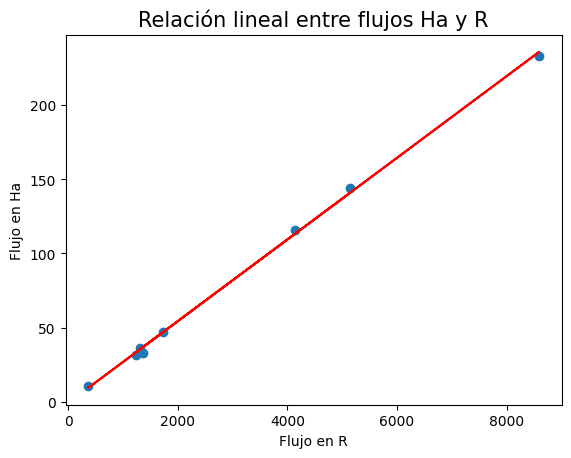

In [94]:
plt.figure('Recta de mejor ajuste')
plt.title('Regression line', fontsize=15)
plt.scatter(aperturer, apertureH)
plt.xlabel('R Aperture')
plt.ylabel('H-alpha Aperture')
plt.plot(x, y, color='red')

We see that all the points lie on the line, so it would not be necessary to remove any points. Otherwise, we would need to remove the points that deviate from the linear relationship and perform the linear regression again.

## Superimage

https://docs.scipy.org/doc/scipy/reference/ndimage.html

Once the slope of the regression line is obtained, we get the galaxy image by subtracting the R image multiplied by the slope from the corresponding H$\alpha$ image.

In [95]:
superimage = supergalaxyH - supergalaxyr * m_coef

/tmp/ipykernel_4195/4115815042.py:1: RuntimeWarning: invalid value encountered in subtract
  superimage = supergalaxyH - supergalaxyr * m_coef


Now we see how we have managed to eliminate all flux that is not associated with the H$\alpha$ line, so that we can locate the H II regions in the image, which are the only ones highlighted in yellow.

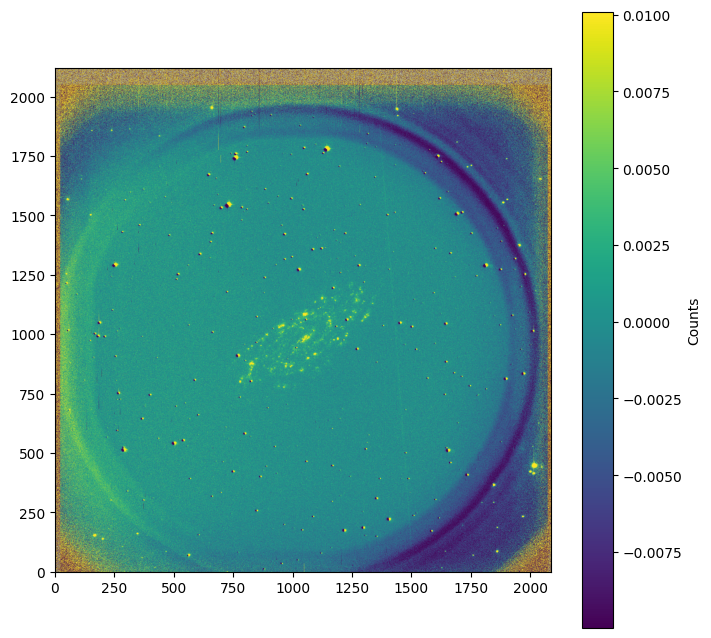

In [96]:
superimage_plot = superimage[300:-300, 300:-300]
plt.figure("Superimage", figsize=(8, 8))
plt.imshow(
    superimage, 
    vmin=imstats(superimage_plot)['median'] - 0.3 * imstats(superimage_plot])['desviation'], 
    vmax=imstats(superimage_plot)['median'] + 0.3 * imstats(superimage_plot)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Clean Galaxy H II Regions")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

Now, we just need to adjust the image. We zoom in to see only the galaxy and rotate it, expanding the vertical axis to view it from the front.

In [97]:
supergalaxy = superimage[700:-800, 600:-600]

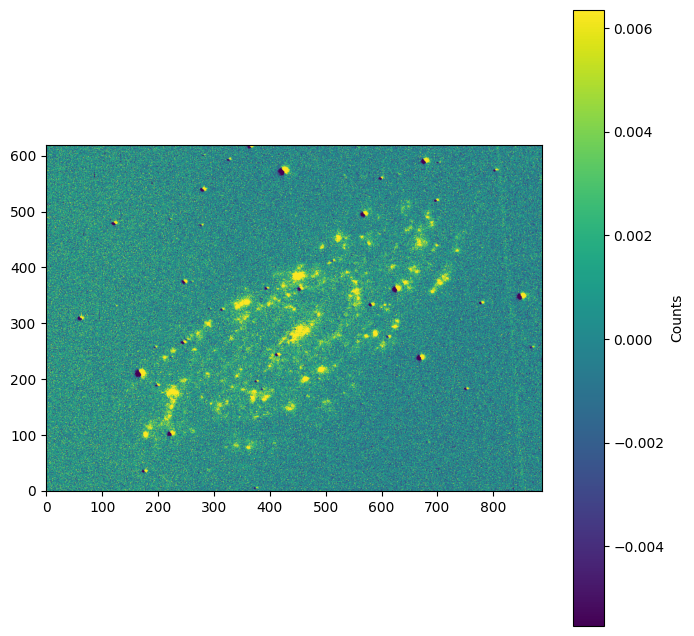

In [98]:
plt.figure("Superimage", figsize=(8, 8))
plt.imshow(
    supergalaxy, 
    vmin=np.median(supergalaxy) - 0.6 * imstats(supergalaxy)['desviation'], 
    vmax=np.median(supergalaxy) + 0.6 * imstats(supergalaxy)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Clean Galaxy H II Regions")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

Now we rotate the image to place it horizontally.

In [99]:
supergalaxy_plot = ndimage.rotate(supergalaxy, 30, reshape=False, mode='mirror')

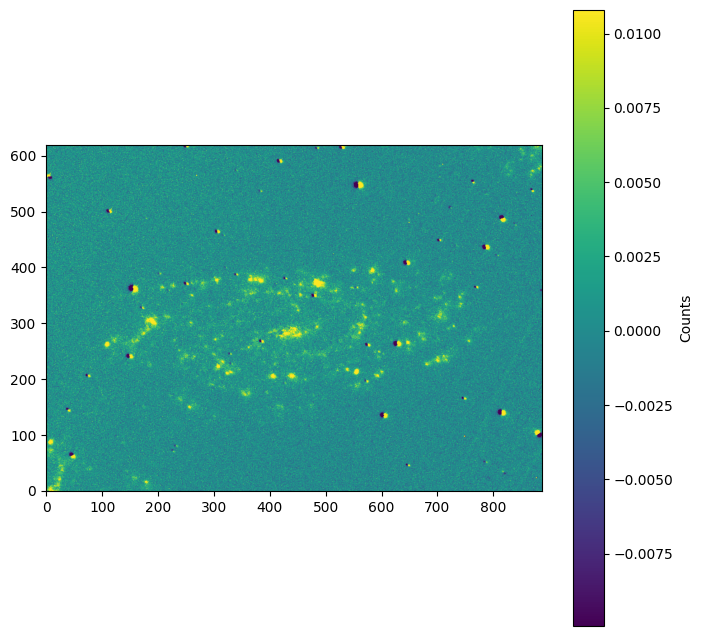

In [100]:
plt.figure("Superimage", figsize=(8, 8))
plt.imshow(
    supergalaxy_plot, 
    vmin=np.median(supergalaxy_plot) - 1 * imstats(supergalaxy_plot)['desviation'], 
    vmax=np.median(supergalaxy_plot) + 1 * imstats(supergalaxy_plot)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Clean Galaxy H II Regions")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

With *zoom*, we expand the vertical axis.

In [101]:
supergalaxy_plot2 = ndimage.zoom(supergalaxy_plot, (2.0, 1.0))

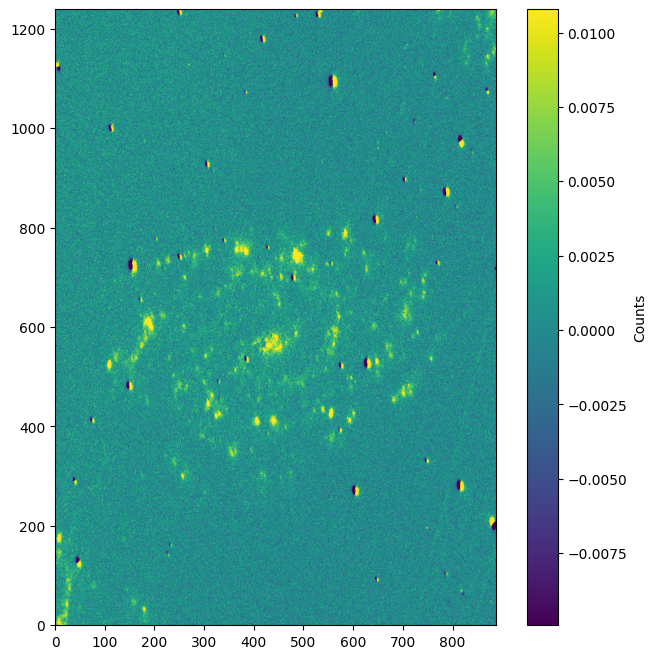

In [102]:
plt.figure("Superimage", figsize=(8, 8))
plt.imshow(
    supergalaxy_plot2, 
    vmin=np.median(supergalaxy_plot2) - 1 * imstats(supergalaxy_plot2)['desviation'], 
    vmax=np.median(supergalaxy_plot2) + 1 * imstats(supergalaxy_plot2)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Clean Galaxy H II Regions")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

We zoom in again.

In [103]:
supergalaxy_plot3 = supergalaxy_plot2[250:-350, 50:-50]

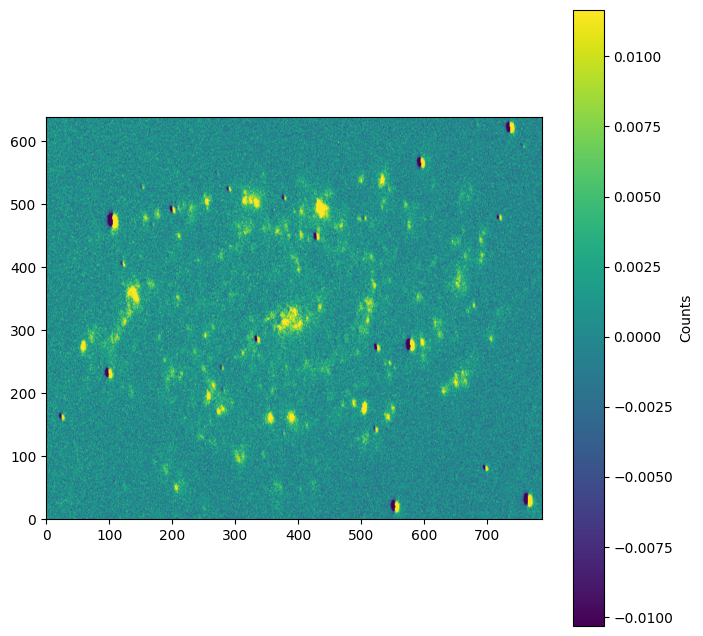

In [104]:
plt.figure("Superimage", figsize=(8, 8))
plt.imshow(
    supergalaxy_plot3, 
    vmin=np.median(supergalaxy_plot3) - 1 * imstats(supergalaxy_plot3)['desviation'], 
    vmax=np.median(supergalaxy_plot3) + 1 * imstats(supergalaxy_plot3)['desviation'],  
    origin="lower"
)
plt.colorbar(label="Counts")
plt.title("Clean Galaxy H II Regions")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

We save the final cleaned image.

In [105]:
hdu_superimage = fits.PrimaryHDU(supergalaxy_plot3.astype(np.float32))
hdu_superimage.writeto('cleangalaxy.fits', overwrite=True)

# H II Regions

https://photutils.readthedocs.io/en/stable/user_guide/detection.html

To locate the H II regions, we use the *Star Finder* function again.

In [106]:
mean, median, std = sigma_clipped_stats(supergalaxy_plot3, sigma=4.0)    
std=imstats(supergalaxy_plot3)['desviation']
daofind = DAOStarFinder(fwhm=10.0, threshold=1*std)
sources = daofind(supergalaxy_plot3 - imstats(supergalaxy_plot3)['median'])
for col in sources.colnames:  
    if col not in ('id', 'npix'):
        sources[col].info.format = '%.2f' 
sources.pprint(max_width=76)

 id xcentroid ycentroid sharpness ... peak  flux  mag  daofind_mag
--- --------- --------- --------- ... ---- ----- ----- -----------
  1    250.24     16.82      0.57 ... 0.00  0.09  2.64       -0.34
  2    206.22     49.66      0.62 ... 0.02  0.75  0.31       -1.30
  3    370.48     49.84      0.77 ... 0.01  0.29  1.35       -0.09
  4    364.65     54.31      0.51 ... 0.00  0.28  1.40       -0.08
  5    423.31     57.26      0.26 ... 0.00  0.19  1.83       -0.02
  6    305.24     94.63      0.44 ... 0.01  0.83  0.21       -0.53
  7    311.53     98.46      0.76 ... 0.01  0.58  0.59       -0.13
  8    344.24    102.48      0.40 ... 0.00  0.14  2.12       -0.23
  9    504.93    125.39      0.35 ... 0.01  0.48  0.79       -0.10
 10    245.91    130.13      0.94 ... 0.01  0.37  1.07       -0.28
...       ...       ...       ... ...  ...   ...   ...         ...
113    314.89    505.21      0.32 ... 0.01  1.33 -0.31       -1.34
114    535.22    504.08      0.73 ... 0.01  0.41  0.97       -

We are going to try to locate the H II regions in the image.

In [107]:
positions_HII = np.transpose((sources['xcentroid'], sources['ycentroid']))
apertures_HII = CircularAperture(positions_HII, r=11.0)

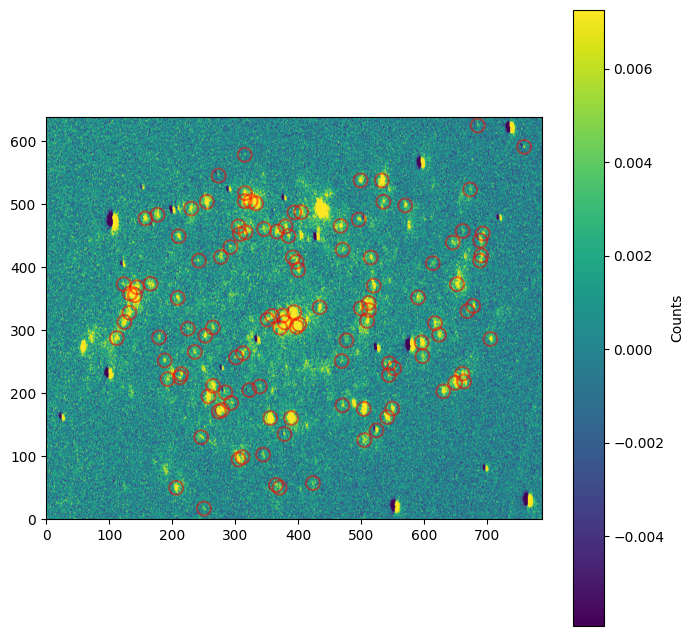

In [108]:
plt.figure("H II Regions", figsize=(8, 8))
plt.imshow(
    supergalaxy_plot3, 
    vmin=np.median(supergalaxy_plot3)-0.6*imstats(supergalaxy_plot3)['desviation'], 
    vmax=np.median(supergalaxy_plot3)+0.6*imstats(supergalaxy_plot3)['desviation'],  
    origin="lower"
)
apertures_HII.plot(color='red', lw=1.5, alpha=0.5)
plt.colorbar(label="Counts")
plt.title("Clean Galaxy H II Regions")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

## 2-D Plot

https://matplotlib.org/stable/

We are going to plot the H II regions in two dimensions using matplotlib.

In [109]:
peak = sources['peak']
flux = sources['flux']
x = sources['xcentroid']
y = sources['ycentroid']

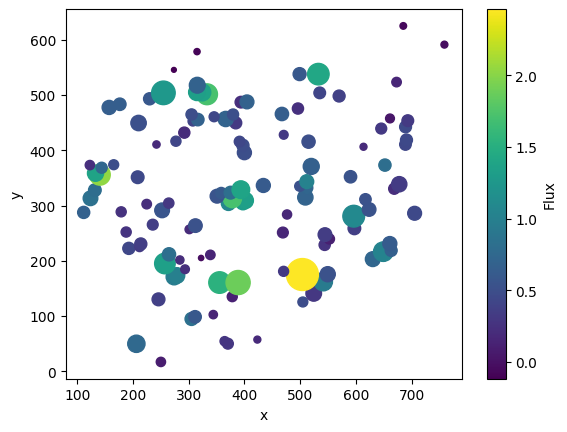

In [110]:
plt.figure("H II Regions")
plt.scatter(x, y, s=peak*10**4, c=flux, cmap='viridis')
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar(label='Flux')
plt.title("Clean Galaxy H II Regions 2D")
plt.xlabel("Pixel")
plt.ylabel("Pixel")
plt.show()

## 3-D Plot

https://matplotlib.org/stable/

We plot in 3 dimensions.

Text(0.5, 0, 'Z Label')

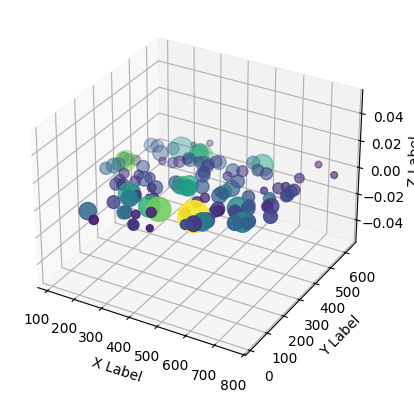

In [111]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
z = np.zeros_like(x)
ax.scatter(x, y, s=peak*10**4, c=flux, cmap='viridis')
ax.set_xlabel('X Pixel')
ax.set_ylabel('Y Pixel')
ax.set_zlabel('Z Pixel')
ax.set_title("3D H II Regions")

# Conclusion

We have successfully cleaned a real image from multiple types of noise that hindered our ability to observe the H II regions of the galaxy under study and represented these regions in two and three dimensions. In doing so, we have addressed one of the objectives, which was to remove cosmic rays or sky light, among others, using the bias and flats, and also deal with defective pixel lines.

The other objective was obviously to locate the H II regions, which we achieved using the photutils functions. In this regard, we have identified areas of the galaxy where star formation is occurring, as well as studying its morphology. Thus, we see that, especially in the disk, new stars are being formed; in other words, the young star population is found in this part of the galaxy as well as in the bulge. In the graphs, the spiral arms of the galaxy and the existence of the bulge itself can be appreciated.